### Checking out the test images.
These are the images I will test my pipeline on

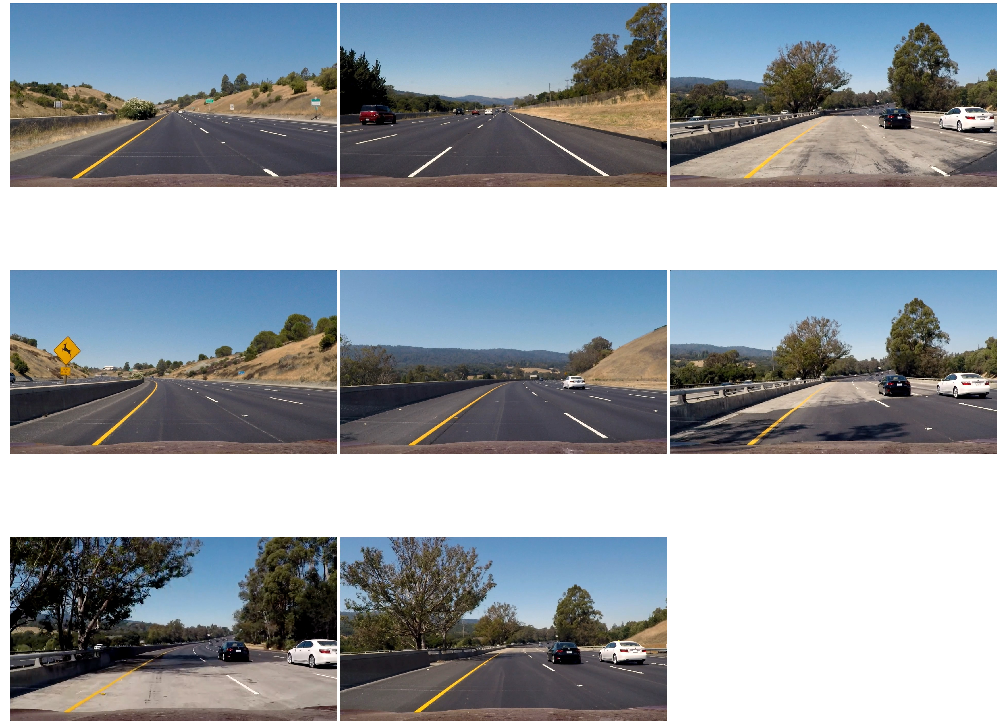

In [121]:
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
import numpy as np
%matplotlib inline

img_list = glob.glob("./test_images/*.jpg")
test_images = []

fig = plt.figure(figsize=(60,50))
fig.subplots_adjust(wspace = 0.009, hspace = 0.00009 )
plt.clf()

for i,im in enumerate(img_list):
    image = mpimg.imread(im)
    test_images.append(image)
    ax = fig.add_subplot(3,3,i+1)
    ax.imshow(image)
    ax.axis('off')
    
plt.show()

### Steps to follow:

##### Part 1:
* Camera calibration and Distortion correction
* Color and gradient thresholding to identify the lane pixels.
* Perspective transform

After this you will have an Undistorted-Thresholded-Warped-image

##### Part 2:
* Locating the Lane Lines and Fiting a Polynomial

In [122]:
# Returns mtx: calibrattion matrix, dist: distortion coefficients
# calb_images: List of images used for calibration
def calibrateCam(cal_images):
    objp = np.zeros((9*6,3) , np.float32)
    objp[:,:2] = np.mgrid[0:9, 0:6 ].T.reshape(-1,2)

    imgpoints = [] # Coordinates of the corners 'found' in each chessboard (CHboard1,CHboard2,CHboard3...CHboard11)
    objpoints = [] # Actual Chessboard coordinates
    
    for image in cal_images:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        ret, corners = cv2.findChessboardCorners(gray, (9,6), None)
        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp)
    
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    return mtx, dist

#Undistort image
def undistortImage(image):
    return cv2.undistort(image, mtx, dist, None, mtx)



############################################ Gradient methods #################################

# gradient in x or y (Using Sobel) and set thresholds to identify pixels 
# within a certain gradient range.
def abs_sobel_thresh(img, orient='x', thresh_min=25, thresh_max=255):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    elif orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude
    binary_output = np.zeros_like(scaled_sobel)
            # is > thresh_min and < thresh_max
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    # 6) Return this mask as your binary_output image
    return binary_output


# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
# This is a sophisticated version of the above function

## Imp. note: Gradient magnitude is at the heart of Canny edge detection, and is why Canny works 
## well for picking up all edges.

def mag_sobel_threshold(img, sobel_kernel=25, mag_thresh=(25, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1,0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0,1, ksize=sobel_kernel)
    # 3) Calculate the magnitude
    grad_magnitude = np.sqrt(np.power(sobelx,2) + np.power(sobely,2))
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(grad_magnitude)/255
    grad_magnitude = (grad_magnitude/scale_factor).astype(np.uint8)
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(grad_magnitude)
    # 6) Return this mask as your binary_output image
    binary_output[ (grad_magnitude >= mag_thresh[0]) & (grad_magnitude <= mag_thresh[1])] = 1
    return binary_output


# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.

## Imp. note: this is the new function at our disposal which really works well to identify the lane lines.
def dir_sobel_threshold(img, sobel_kernel=7, thresh=(0, 0.09)):
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1,0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0,1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient
    direction_sobel = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(direction_sobel)
    # 6) Return this mask as your binary_output image
    binary_output[ (direction_sobel > thresh[0] ) & (direction_sobel < thresh[1]) ] =1
    return binary_output


######################################## color thresholds #######################################################


def hls_selection(img, channel='h', thresh=(0, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # 2) Apply a threshold to the S channel
    if(channel == 'h'):
        c = hls[:,:,0]
    elif(channel == 'l'):
        c = hls[:,:,1]
    elif(channel == 's'):
        c = hls[:,:,2]        

    # 3) Return a binary image of threshold result
    binary_output = np.zeros_like(c) # placeholder line
    binary_output[(c > thresh[0]) & (c <= thresh[1])] = 1
    return binary_output

def rgb_selection(img, channel='r', thresh=(0,255)):
    
    if(channel == 'r'):
        c = img[:,:,0]
    elif(channel == 'g'):
        c = img[:,:,1]
    elif(channel == 'b'):
        c = img[:,:,2]        

    # 3) Return a binary image of threshold result
    binary_output = np.zeros_like(c) # placeholder line
    binary_output[(c > thresh[0]) & (c <= thresh[1])] = 1
    return binary_output


def applyColorFilter(image):
    """
    Filter the image to include only yellow and white pixels
    """
    # Gets only white pixels
    low_white = np.array([200, 200, 200])
    high_white = np.array([255, 255, 255])
    white_mask = cv2.inRange(image, low_white, high_white)
    white_image = cv2.bitwise_and(image, image, mask=white_mask)

    # Gets only yellow pixels
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    low_yellow = np.array([90,100,100])
    high_yellow = np.array([110,255,255])
    yellow_mask = cv2.inRange(hsv, low_yellow, high_yellow)
    yellow_image = cv2.bitwise_and(image, image, mask=yellow_mask)

    # Combining the images
    combined = cv2.addWeighted(white_image, 1., yellow_image, 1., 0.)
    combined = cv2.cvtColor(combined, cv2.COLOR_RGB2GRAY)
    binary_output = np.zeros_like(combined) # placeholder line
    binary_output[ combined > 0 ] = 1
    return binary_output

###################################################################################################################

def applyGradientThresh(image):
    # Set Thresholds
    grad_t = (0, 0.09)
    dir_t = (0.7, 1.3)
    mag_t = (30, 100)
    gradx = abs_sobel_thresh(image, orient='x', thresh_min=grad_t[0], thresh_max=grad_t[1])
    grady = abs_sobel_thresh(image, orient='y', thresh_min=grad_t[0], thresh_max=grad_t[1])
    dir_binary = dir_sobel_threshold(image, sobel_kernel=15, thresh = dir_t)
    mag_binary = mag_sobel_threshold(image, sobel_kernel=9, mag_thresh = mag_t)
    
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    return combined


def applyColorThresh(image):
    s_t = (125, 255)
    h_t = (15, 100)
    r_t = (200, 255)
    s_binary = hls_selection(image, 's', thresh= s_t)
    h_binary = hls_selection(image, 'h', thresh= h_t)
    r_binary = rgb_selection(image, 'r', thresh= r_t)
    color_filter = applyColorFilter(image)
    
    # (s-channel_binary & h-channel_binary) or r_channel_binary
    combined = np.zeros_like(r_binary)
    combined[(color_filter == 1) & ( (s_binary == 1) | (h_binary == 1) | (r_binary == 1)) ] = 1
    return combined
    
def warpImage(image, src, dst):
    h,w = image.shape[:2]
    # use cv2.getPerspectiveTransform() to get M, the transform matrix, and Minv, the inverse
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    # use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(image, M, (w,h))
    return warped, Minv

##### Teasting the color-filter

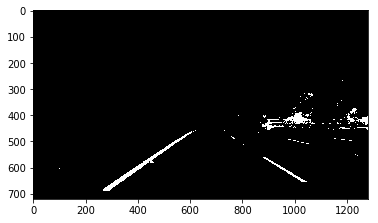

In [123]:
imgfil = applyColorFilter(test_images[4])
plt.clf()
plt.imshow(imgfil, cmap='gray')
plt.show()


##### Camera calibration

In [125]:
# Reading the Calibration images and putting in images[]
list_of_images = glob.glob("./camera_cal/*")
cal_images = []
for im in list_of_images:
    cal_images.append(mpimg.imread(im))
    
# Camera Calibration with images[]
mtx, dist = calibrateCam(cal_images)

##### Check undistortion

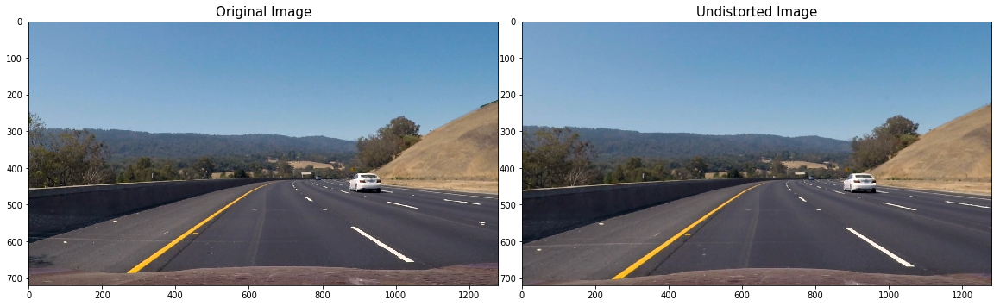

In [126]:
img = mpimg.imread('./test_images/test3.jpg')
img_undistort = undistortImage(img)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)

ax1.imshow(img)
ax1.set_title('Original Image', fontsize=15)

ax2.imshow(img_undistort)
ax2.set_title('Undistorted Image', fontsize=15)

f.savefig("./output_images/undistortion.png")

##### Check perspective Transform

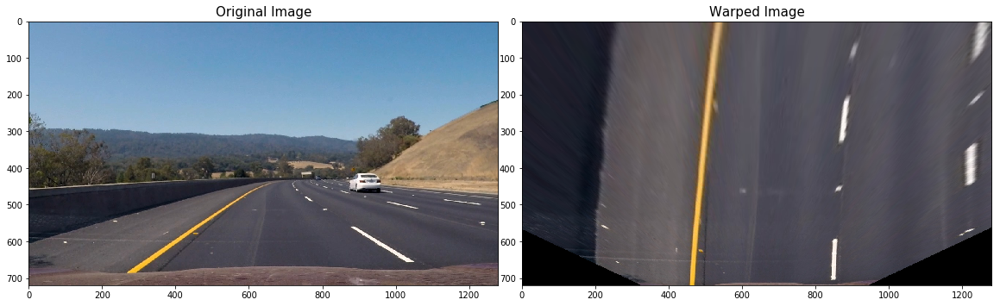

In [127]:
height,width = image.shape[:2]
src = np.float32( [(575,464), (707,464), (258,682), (1049,682)] )
dst = np.float32( [(450,0), (width-450,0), (450,height), (width-450,height)])

warped, Minv = warpImage(img, src, dst) 

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=15)
ax2.imshow(warped)
ax2.set_title('Warped Image', fontsize=15)

f.savefig("./output_images/perspective.png")

In [128]:

# Returns an Undistorted-Thresholded-Warped-image.
# image: input image, mtx: calibrattion matrix, dist: distortion coefficients
def pipeline(image):
    
    height,width = image.shape[:2]

    # define source and destination points for transform
    src = np.float32( [(575,464), (707,464), (258,682), (1049,682)] )
    dst = np.float32( [(450,0), (width-450,0), (450,height), (width-450,height)])
    
    dest = undistortImage(image)      # Undistorted !
    
    t1 = applyGradientThresh(dest)               # t1
    
    t2 = applyColorThresh(dest)                  # t2
    
    combined = np.zeros_like(t2)
    combined[ (t1 == 1) & (t2 == 1)  ] = 1       # Thresholded  (t1 and t2 combined)
    warped, Minv = warpImage(combined, src, dst)                 # warped
    return warped, Minv

##### Testing the pipeline on test images


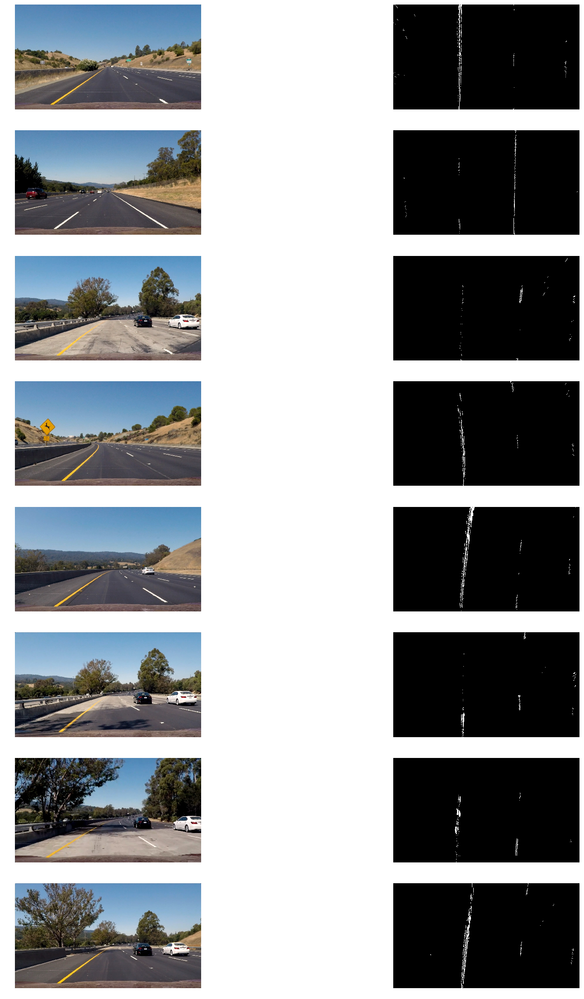

In [129]:
                                       
# Set up plot
plt.clf()
fig, axs = plt.subplots(len(test_images),2, figsize=(30, 40))
fig.subplots_adjust(hspace = .2, wspace=.000001)
axs = axs.ravel()
i=0                 

for image in test_images:
    img_bin, Minv = pipeline(image)
    axs[i].imshow(image)
    axs[i].axis('off')
    i+=1
    axs[i].imshow(img_bin, cmap='gray')
    axs[i].axis('off')
    i+=1

plt.show()

fig.savefig("./output_images/Undistorted-Thresholded-Warped.png")

In [130]:
def identifyLanes_slidingWindow(binary_warped, return_windows=False):
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)

    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    rect_coords = []
    # Choose the number of sliding windows
    nwindows = 10
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 80
    # Set minimum number of pixels found to recenter window
    minpix = 40
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        # Will be  used to display each window in viz
        rect_coords.append((win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high))

        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    if(return_windows == True):
        return left_fit, right_fit, left_lane_inds, right_lane_inds, rect_coords
    else:
        return left_fit, right_fit, left_lane_inds, right_lane_inds

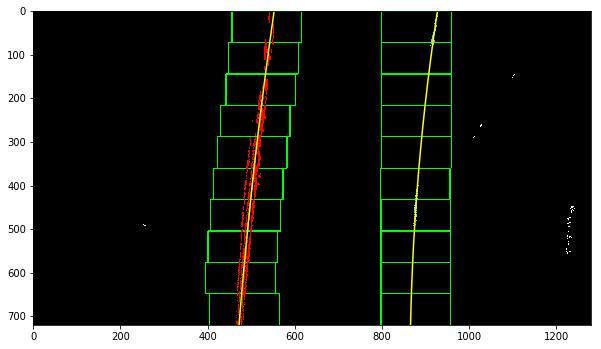

In [131]:
# visualize the result on example image
plt.clf()
test_img = test_images[7]

warped_img, Minv = pipeline(test_img)
    
left_fit, right_fit, left_lane_inds, right_lane_inds, rect = identifyLanes_slidingWindow(warped_img, return_windows=True)


# Create an output image to draw on and  visualize the result
out_img = np.uint8(np.dstack((warped_img, warped_img, warped_img))*255)

# Generate x and y values for plotting
ploty = np.linspace(0, warped_img.shape[0]-1, warped_img.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

# Draw the windows on the warped image
for r in rect:
    cv2.rectangle(out_img,(r[2],r[0]),(r[3],r[1]),(0,255,0), 2) 
    cv2.rectangle(out_img,(r[4],r[0]),(r[5],r[1]),(0,255,0), 2) 

# Identify the x and y positions of all nonzero pixels in the image
nonzero = warped_img.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [100, 200, 255]

f, ax = plt.subplots(1, 1, figsize=(10,10))
f.subplots_adjust(hspace = .2, wspace=.05)

ax.imshow(out_img)
ax.plot(left_fitx, ploty, color='yellow')
ax.plot(right_fitx, ploty, color='yellow')


f.savefig("./output_images/sliding_window.png")

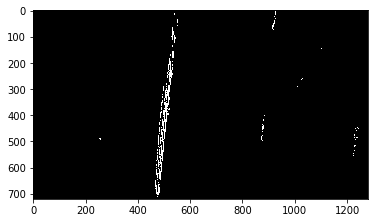

In [132]:
plt.imshow(warped_img, cmap='gray')

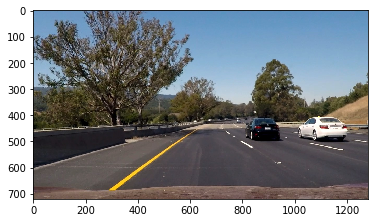

In [133]:
plt.clf()
plt.imshow(test_images[7])

##### The Lane lines seem to be identified just fine.

In [134]:
def identifyLanes_concise(warped_image, left_fit_old, right_fit_old):
    
    nonzero = warped_image.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 80
    left_lane_inds = ((nonzerox > (left_fit_old[0]*(nonzeroy**2) + left_fit_old[1]*nonzeroy + left_fit_old[2] - margin)) & 
                      (nonzerox < (left_fit_old[0]*(nonzeroy**2) + left_fit_old[1]*nonzeroy + left_fit_old[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit_old[0]*(nonzeroy**2) + right_fit_old[1]*nonzeroy + right_fit_old[2] - margin)) & 
                       (nonzerox < (right_fit_old[0]*(nonzeroy**2) + right_fit_old[1]*nonzeroy + right_fit_old[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit_new = np.polyfit(lefty, leftx, 2)
    right_fit_new = np.polyfit(righty, rightx, 2)
    
    return left_fit_new, right_fit_new, left_lane_inds, right_lane_inds

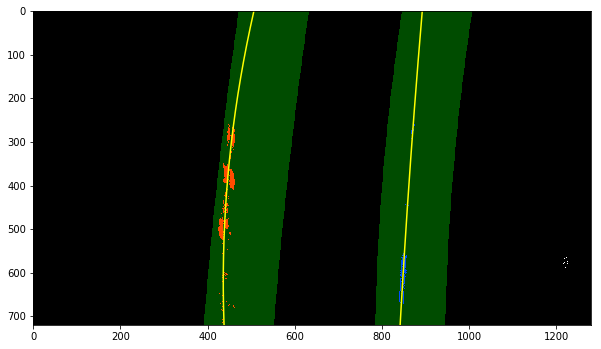

In [135]:
# visualize the result on example image
test_im = test_images[6]

bin_im, Minv = pipeline(test_im)   
margin = 80

left_fit2, right_fit2, left_lane_inds2, right_lane_inds2 = identifyLanes_concise(bin_im, left_fit, right_fit)

# Generate x and y values for plotting
ploty = np.linspace(0, bin_im.shape[0]-1, bin_im.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
left_fitx2 = left_fit2[0]*ploty**2 + left_fit2[1]*ploty + left_fit2[2]
right_fitx2 = right_fit2[0]*ploty**2 + right_fit2[1]*ploty + right_fit2[2]

# Create an image to draw on and an image to show the selection window
out_img = np.uint8(np.dstack((bin_im, bin_im, bin_im))*255)
final_img = np.zeros_like(out_img)

# Color in left and right line pixels
nonzero = bin_im.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[left_lane_inds2], nonzerox[left_lane_inds2]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds2], nonzerox[right_lane_inds2]] = [0, 0, 255]


left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(final_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(final_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, final_img, 0.3, 0)

fi, ax1 = plt.subplots(1, 1, figsize=(10,10))
fi.subplots_adjust(hspace = .2, wspace=.05)

ax1.imshow(result)
ax1.plot(left_fitx2, ploty, color='yellow')
ax1.plot(right_fitx2, ploty, color='yellow')

fi.savefig("./output_images/concise.png")

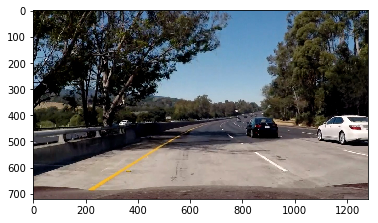

In [136]:
plt.imshow(test_images[6])

There is some irregularity here... the lanes are the not really parallel. This is probably because we are
using the older fit values to predict the new points on the left and right lanes.


##### Drawing the lane on the original image

In [137]:
# Borrowed from the lesson# 36 (tips and tricks)

def draw_lane(image_original, image_binary, left_fit, right_fit, Minv):
    image_copy = np.copy(image_original)
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(image_binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    h =  image_binary.shape[0]
    ploty = np.linspace(0, h-1, num=h)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image_binary.shape[1], image_binary.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(image_copy, 1, newwarp, 0.3, 0)
    return result

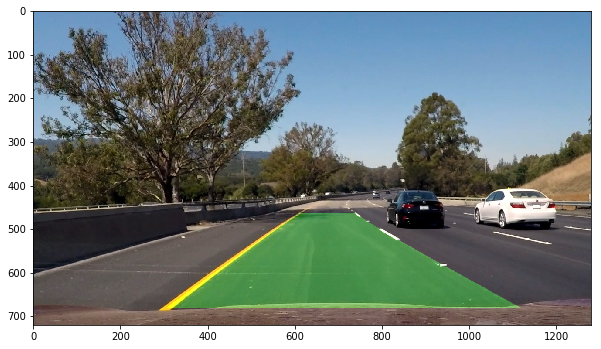

In [138]:
out = draw_lane(test_img, warped_img, left_fit, right_fit, Minv)

f, ax = plt.subplots(1, 1, figsize=(10,10))
f.subplots_adjust(hspace = .2, wspace=.05)

ax.imshow(out)

f.savefig("./output_images/drawlane.png")

In [139]:
def displayData(original_img, curv_rad, center_dist):
    image_copy = np.copy(original_img)
    width = image_copy.shape[1]
    font = cv2.FONT_HERSHEY_SIMPLEX
    fontScale = 1
    fontColor = (0,0,0)
    lineType = 2
    curv_rad= curv_rad
    text = 'Curvature radius: {0: .2f} m'.format(curv_rad)
    cv2.putText(image_copy, text, (width - 600,80), font, fontScale, fontColor, lineType)
    center_dist = abs(center_dist)
    text = 'Deviation: {0: .2f} m'.format(center_dist)
    cv2.putText(image_copy, text, (width - 600, 120), font, fontScale, fontColor, lineType)
    return image_copy

In [140]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = []
        # y values of the last n fits of the line
        self.recent_yfitted = []
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float')
        #y values for line fit
        self.yvals = np.linspace(0, 719, 720)
        # origin (pixels) of fitted line at the bottom of the image
        self.base_pos = None
        #distance in meters of vehicle center from the line
        self.dist_from_center = None 

    def set_dist_from_center(self):
        y_eval = max(self.yvals)
        self.base_pos = self.best_fit[0]*y_eval**2 + self.best_fit[1]*y_eval + self.best_fit[2]
        center = 640 # Center of the image/Car - Camera is assumed to be at center
        self.dist_from_center = (self.base_pos - center)*3.7/400
    
    ## Function is too big. Need to break it up
    def append_fit(self,warpImg , fit, inds):
        # append the fit and keep the count limited to n=5
        
        nonzero = warpImg.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        
        
        if((fit is not None) & (inds is not None)) :
            if self.best_fit is not None:
                # comparing 'fit' to the 'best_fit'
                self.diffs = abs(fit-self.best_fit)
            if (self.diffs[0] > 0.001 or self.diffs[1] > 1.0 or self.diffs[2] > 100.) and len(self.current_fit) > 0:
                self.detected = False
            else:
                self.current_fit.append(fit)
                self.recent_xfitted.append(nonzerox[inds])
                self.recent_yfitted.append(nonzeroy[inds])
                if len(self.current_fit) > 5:
                    # drop old fits, keep newest n
                    self.current_fit = self.current_fit[-5:]
                if len(self.recent_xfitted) > 5:
                    self.recent_xfitted = self.recent_xfitted[-5:]
                if len(self.recent_yfitted) > 5:
                    self.recent_yfitted = self.recent_yfitted[-5:]
                self.best_fit = np.average(self.current_fit, axis=0)
                self.detected = True
        # remove a fit from the records
        else:
            self.detected = False
            if len(self.current_fit) > 0:
                # drop the oldest fit
                self.current_fit = self.current_fit[1:]
                self.recent_xfitted = self.recent_xfitted[1:]
                self.recent_yfitted = self.recent_yfitted[1:]
            if len(self.current_fit) > 0:
                # best_fit => Average of all remaining fits in the array
                self.best_fit = np.average(self.current_fit, axis=0)
                
        self.set_dist_from_center()
        self.calc_curvature()
            
    
    def calc_curvature(self):
        ym_per_pix = 3.048/100   ## approx estimate from the binary image
        xm_per_pix = 3.7/400
        # y_val is the y-value for which we will calculate the radius of curvature
        y_eval = np.max(self.yvals)
    
        x = self.recent_xfitted[len(self.recent_xfitted)-1]
        y = self.recent_yfitted[len(self.recent_yfitted)-1]
        # new polynomial-fit in accordance with world space
        world_fit = np.polyfit(y*ym_per_pix, x*xm_per_pix, 2)
        # Calculate the new radii of curvature
        self.radius_of_curvature = ((1 + (2*world_fit[0]*y_eval*ym_per_pix + world_fit[1])**2)**1.5) / np.absolute(2*world_fit[0])
        # Now our radius of curvature is in meters

In [142]:
def process_image(img):
    img_copy = np.copy(img)
    
    height,width = img_copy.shape[:2]

    # define source and destination points for transform
    src = np.float32( [(575,464), (707,464), (258,682), (1049,682)] )
    dst = np.float32( [(450,0), (width-450,0), (450,height), (width-450,height)])
    
    dest = undistortImage(img_copy)      # Undistorted !
    
    t1 = applyGradientThresh(dest)               # t1
    
    t2 = applyColorThresh(dest)                  # t2
    
    combined = np.zeros_like(t2)
    combined[ (t1 == 1) & (t2 == 1)  ] = 1       # Thresholded  (t1 and t2 combined)
    warped_bin_img, Minv = warpImage(combined, src, dst) 
    
    
    # Choosing the right function to identify new lines
    if ((left_line.detected == False) or (right_line.detected==False)):
        left_fit, right_fit, left_lane_inds, right_lane_inds = identifyLanes_slidingWindow(warped_bin_img)
    else:
        left_fit, right_fit, left_lane_inds, right_lane_inds = identifyLanes_concise(warped_bin_img, left_line.best_fit, right_line.best_fit)
        
    # Check the difference in x-intercepts ~ 350 px (width)
    if ((left_fit is not None) and (right_fit is not None)):
        h = img.shape[0]
        left_fit_x_ind = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
        right_fit_x_ind = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]
        x_diff = abs(right_fit_x_ind - left_fit_x_ind)
        if abs(350 - x_diff) > 100:
            left_fit = None
            right_fit = None
    
    left_line.append_fit(warped_bin_img, left_fit, left_lane_inds)
    right_line.append_fit(warped_bin_img, right_fit, right_lane_inds)
    
    # draw the lane
    if left_line.best_fit is not None and right_line.best_fit is not None:
        
        lane_width = 3.7
        veh_pos_wrt_center = -1*round( 0.5*(abs(right_line.dist_from_center)-lane_width/2) +  0.5*(abs(left_line.dist_from_center)-lane_width/2), 2)
        
        output_img = draw_lane(dest, warped_bin_img, left_line.best_fit, right_line.best_fit, Minv)
        # Add the display data
        l = left_line.radius_of_curvature if left_line.radius_of_curvature is not None else 0
        r = right_line.radius_of_curvature if right_line.radius_of_curvature is not None else 0
        output_img = displayData(output_img, (l + r)/2, veh_pos_wrt_center)
    else:
        output_img = img_copy    
    return output_img


#####  Testing on test images

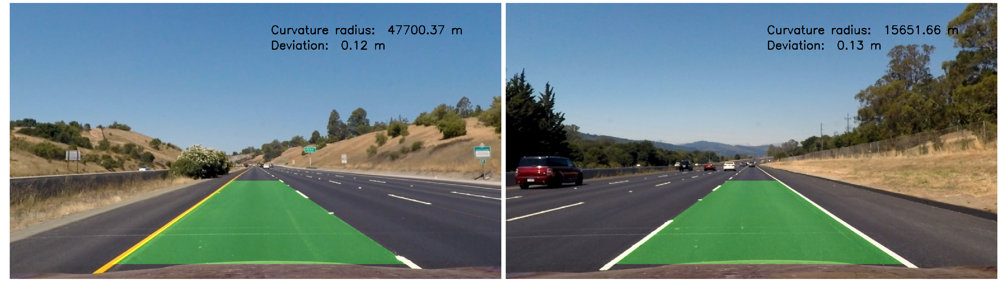

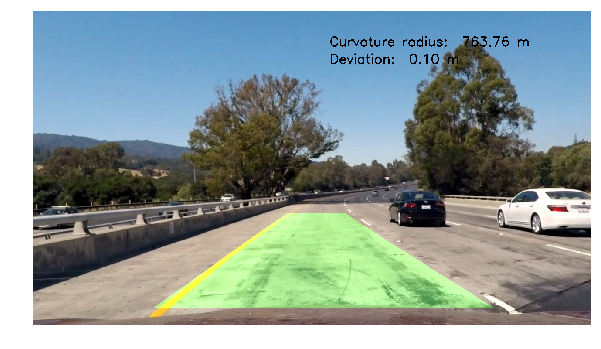

In [152]:
left_line = Line()
right_line = Line()

plt.clf()

f, axs = plt.subplots(1, 2, figsize=(60,50))
f.subplots_adjust(wspace = 0.009, hspace = 0.00009 )
axs = axs.ravel()
i=0



f2, axs2 = plt.subplots(1, 1, figsize=(10,10))
f.subplots_adjust(wspace = 0.009, hspace = 0.00009 )


for im in test_images[0:2]:
    axs[i].imshow(process_image(im))
    axs[i].axis('off')
    i+=1

axs2.imshow(process_image(test_images[2]))
axs2.axis('off')

plt.show()
    
f.savefig("./output_images/straight.png")

f2.savefig("./output_images/curves.png")

##### processing video

In [91]:
from ipywidgets import interact, interactive, fixed
from moviepy.editor import VideoFileClip
from IPython.display import HTML

left_line = Line()
right_line = Line()

vid_input = VideoFileClip('project_video.mp4').subclip(0,10)
processed_video = vid_input.fl_image(process_image)
%time processed_video.write_videofile('project_video_sub.mp4', audio=False)

[MoviePy] >>>> Building video project_video_sub.mp4
[MoviePy] Writing video project_video_sub.mp4


100%|█████████▉| 250/251 [02:19<00:00,  1.84it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_sub.mp4 

CPU times: user 2min 42s, sys: 21.6 s, total: 3min 3s
Wall time: 2min 21s


In [93]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format("project_video_sub.mp4"))

In [153]:
left_line = Line()
right_line = Line()

vid_input = VideoFileClip('project_video.mp4')#.subclip(0,10)
processed_video = vid_input.fl_image(process_image)
%time processed_video.write_videofile('project_video_output.mp4', audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [06:31<00:00,  3.27it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 7min 22s, sys: 1min 6s, total: 8min 29s
Wall time: 6min 31s


In [154]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format("project_video_output.mp4"))